In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier

In [ ]:
df = pd.read_csv("BC_data.csv")

In [ ]:
df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN


In [ ]:
# Drop unused columns
df.drop(columns=["id", "Unnamed: 32"], inplace=True)

In [ ]:
# Encode target variable
df["diagnosis"] = LabelEncoder().fit_transform(df["diagnosis"])  # M=1, B=0


In [ ]:
# Split into features and label
X = df.drop("diagnosis", axis=1)
y = df["diagnosis"]

In [ ]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
# Initialize models
models = {
    "Logistic Regression": LogisticRegression(),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "Support Vector Machine": SVC(probability=True),
    "Naive Bayes": GaussianNB(),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss')
}

In [ ]:
# Train and evaluate
results = []

for name, model in models.items():
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    y_prob = model.predict_proba(X_test_scaled)[:, 1] if hasattr(model, "predict_proba") else None

    results.append({
        "Model": name,
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred),
        "Recall": recall_score(y_test, y_pred),
        "F1 Score": f1_score(y_test, y_pred),
        "ROC AUC": roc_auc_score(y_test, y_prob) if y_prob is not None else "N/A"
    })

# Convert to DataFrame
results_df = pd.DataFrame(results)
print(results_df.sort_values(by="Accuracy", ascending=False))

                    Model  Accuracy  Precision    Recall  F1 Score   ROC AUC
3  Support Vector Machine  0.982456   1.000000  0.953488  0.976190  0.997380
0     Logistic Regression  0.973684   0.976190  0.953488  0.964706  0.997380
4             Naive Bayes  0.964912   0.975610  0.930233  0.952381  0.997380
6                 XGBoost  0.956140   0.952381  0.930233  0.941176  0.990829
2           Random Forest  0.956140   0.952381  0.930233  0.941176  0.995742
5     K-Nearest Neighbors  0.947368   0.930233  0.930233  0.930233  0.981985
1           Decision Tree  0.938596   0.909091  0.930233  0.919540  0.936947


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [14:18:31] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


In [ ]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=7c3f5bf96029f0c807c71392a78e47ae907a1340ebc2d9afb35debf43a6b2c68
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


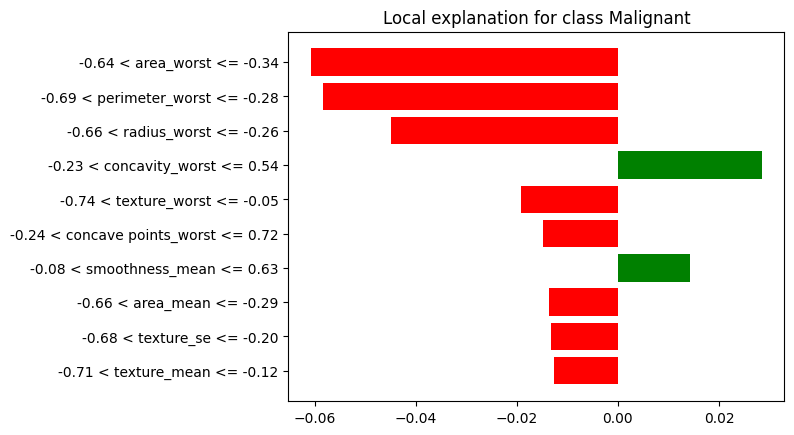

In [ ]:
import lime.lime_tabular
import numpy as np

# Choose the best-performing model (e.g., Random Forest)
best_model = models["Random Forest"]

# Create LIME explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,
    feature_names=X.columns.tolist(),
    class_names=["Benign", "Malignant"],
    discretize_continuous=True
)

# Explain one test instance (e.g., index 0)
idx = 0
lime_exp = lime_explainer.explain_instance(
    data_row=X_test_scaled[idx],
    predict_fn=best_model.predict_proba,
    num_features=10
)

# Show in notebook (or export to HTML)
lime_exp.show_in_notebook(show_table=True)

# Optional: Save explanation as a figure
fig = lime_exp.as_pyplot_figure()
fig.savefig("lime_explanation_rf.png")


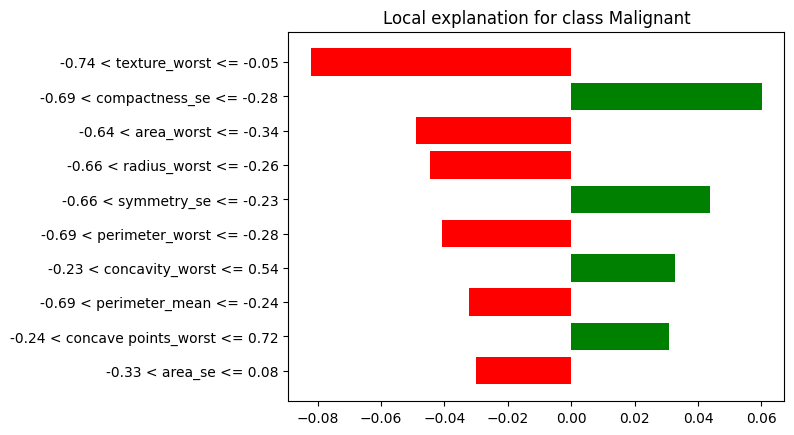

In [ ]:
# Choose the best-performing model (e.g., SVM)
best_model = models["Logistic Regression"]

# Create LIME explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,
    feature_names=X.columns.tolist(),
    class_names=["Benign", "Malignant"],
    discretize_continuous=True
)

# Explain one test instance (e.g., index 0)
idx = 0
lime_exp = lime_explainer.explain_instance(
    data_row=X_test_scaled[idx],
    predict_fn=best_model.predict_proba,
    num_features=10
)

# Show in notebook (or export to HTML)
lime_exp.show_in_notebook(show_table=True)

# Optional: Save explanation as a figure
fig = lime_exp.as_pyplot_figure()
fig.savefig("lime_explanation_LR.png")

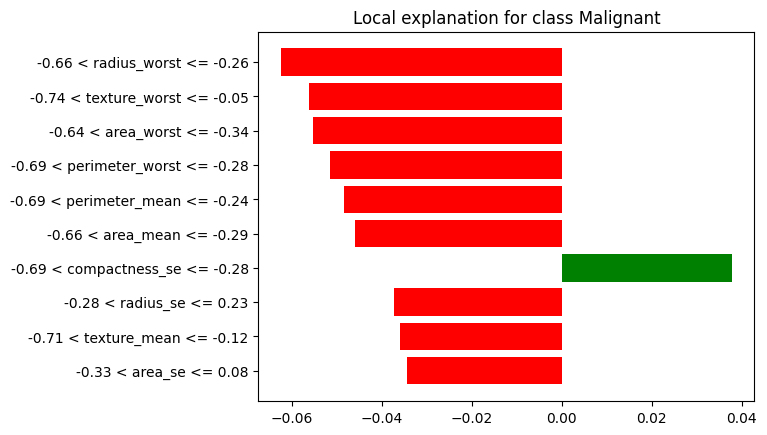

In [ ]:
# Choose the best-performing model (e.g., SVM)
best_model = models["Support Vector Machine"]

# Create LIME explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,
    feature_names=X.columns.tolist(),
    class_names=["Benign", "Malignant"],
    discretize_continuous=True
)

# Explain one test instance (e.g., index 0)
idx = 0
lime_exp = lime_explainer.explain_instance(
    data_row=X_test_scaled[idx],
    predict_fn=best_model.predict_proba,
    num_features=10
)

# Show in notebook (or export to HTML)
lime_exp.show_in_notebook(show_table=True)

# Optional: Save explanation as a figure
fig = lime_exp.as_pyplot_figure()
fig.savefig("lime_explanation_SVM.png")


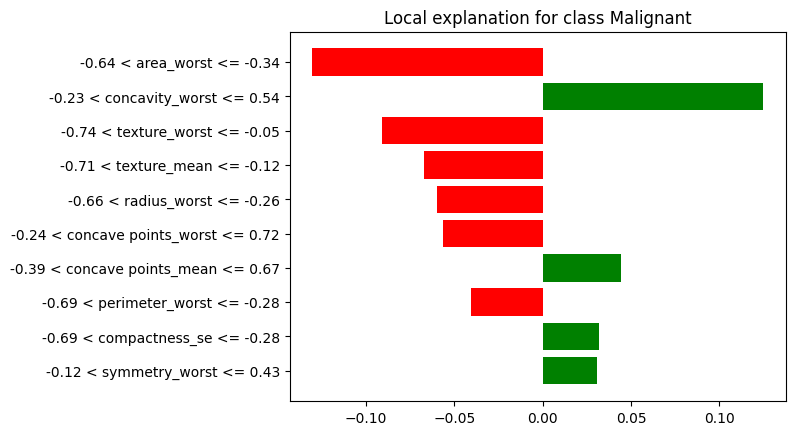

In [ ]:
# Choose the best-performing model (e.g., XG-Boost)
best_model = models["XGBoost"]

# Create LIME explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,
    feature_names=X.columns.tolist(),
    class_names=["Benign", "Malignant"],
    discretize_continuous=True
)

# Explain one test instance (e.g., index 0)
idx = 0
lime_exp = lime_explainer.explain_instance(
    data_row=X_test_scaled[idx],
    predict_fn=best_model.predict_proba,
    num_features=10
)

# Show in notebook (or export to HTML)
lime_exp.show_in_notebook(show_table=True)

# Optional: Save explanation as a figure
fig = lime_exp.as_pyplot_figure()
fig.savefig("lime_explanation_XGB.png")


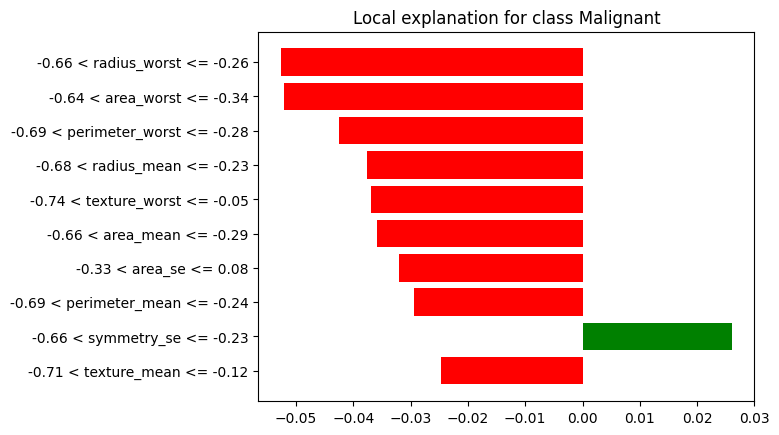

In [ ]:
# Choose the best-performing model (e.g., SVM)
best_model = models["K-Nearest Neighbors"]

# Create LIME explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,
    feature_names=X.columns.tolist(),
    class_names=["Benign", "Malignant"],
    discretize_continuous=True
)

# Explain one test instance (e.g., index 0)
idx = 0
lime_exp = lime_explainer.explain_instance(
    data_row=X_test_scaled[idx],
    predict_fn=best_model.predict_proba,
    num_features=10
)

# Show in notebook (or export to HTML)
lime_exp.show_in_notebook(show_table=True)

# Optional: Save explanation as a figure
fig = lime_exp.as_pyplot_figure()
fig.savefig("lime_explanation_KNN.png")


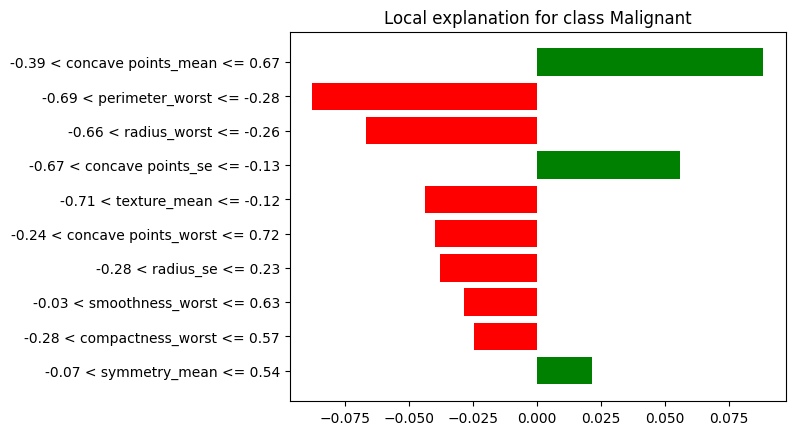

In [ ]:
# Choose the best-performing model (e.g., SVM)
best_model = models["Decision Tree"]

# Create LIME explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,
    feature_names=X.columns.tolist(),
    class_names=["Benign", "Malignant"],
    discretize_continuous=True
)

# Explain one test instance (e.g., index 0)
idx = 0
lime_exp = lime_explainer.explain_instance(
    data_row=X_test_scaled[idx],
    predict_fn=best_model.predict_proba,
    num_features=10
)

# Show in notebook (or export to HTML)
lime_exp.show_in_notebook(show_table=True)

# Optional: Save explanation as a figure
fig = lime_exp.as_pyplot_figure()
fig.savefig("lime_explanation_DT.png")


In [ ]:
pip install shap

In [ ]:
pip install eli5

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.4/108.4 kB 5.6 MB/s eta 0:00:00


In [ ]:
import eli5
from eli5.sklearn import PermutationImportance

# Choose your best model (e.g., Random Forest)
best_model = models["Random Forest"]

# Apply permutation importance on the test set
perm = PermutationImportance(best_model, random_state=42)
perm.fit(X_test_scaled, y_test)

# Display PFI in notebook
eli5.show_weights(perm, feature_names=X.columns.tolist())

# OR to get feature scores in a DataFrame:
perm_df = eli5.explain_weights_df(perm, feature_names=X.columns.tolist())
print(perm_df.head(10))  # Top 10 important features


                   feature    weight       std
0  fractal_dimension_worst  0.000000  0.000000
1           symmetry_worst  0.000000  0.000000
2        compactness_worst  0.000000  0.000000
3              symmetry_se  0.000000  0.000000
4     fractal_dimension_se  0.000000  0.000000
5            texture_worst  0.000000  0.000000
6          smoothness_mean  0.000000  0.000000
7         compactness_mean  0.000000  0.000000
8                radius_se  0.000000  0.000000
9            smoothness_se -0.001754  0.003509


In [ ]:
import matplotlib.pyplot as plt

# Sort and select top 10 important features
top_perm_df = perm_df.sort_values(by="weight", key=abs, ascending=False).head(10)

# Plot and save chart
plt.figure(figsize=(10, 6))
plt.barh(top_perm_df["feature"], top_perm_df["weight"], color="mediumseagreen")
plt.xlabel("Permutation Importance Weight")
plt.title("Top 10 Features - Permutation Feature Importance (RF)")
plt.gca().invert_yaxis()  # Most important at top
plt.tight_layout()
plt.savefig("permutation_importance_chart_RF.png", dpi=600)
plt.close()


In [ ]:
import eli5
from eli5.sklearn import PermutationImportance

# Choose your best model (e.g., Random Forest)
best_model = models["Logistic Regression"]

# Apply permutation importance on the test set
perm = PermutationImportance(best_model, random_state=42)
perm.fit(X_test_scaled, y_test)

# Display PFI in notebook
eli5.show_weights(perm, feature_names=X.columns.tolist())

# OR to get feature scores in a DataFrame:
perm_df = eli5.explain_weights_df(perm, feature_names=X.columns.tolist())
print(perm_df.head(10))  # Top 10 important features

                feature        weight       std
0             radius_se  1.403509e-02  0.010526
1  concave points_worst  1.403509e-02  0.014253
2   concave points_mean  1.228070e-02  0.014253
3        symmetry_worst  5.263158e-03  0.004297
4         texture_worst  3.508772e-03  0.011899
5          perimeter_se  3.508772e-03  0.007018
6               area_se  3.508772e-03  0.004297
7            area_worst  3.508772e-03  0.004297
8        concavity_mean  1.754386e-03  0.006564
9        perimeter_mean  4.440892e-17  0.007846


In [ ]:
import matplotlib.pyplot as plt

# Sort and select top 10 important features
top_perm_df = perm_df.sort_values(by="weight", key=abs, ascending=False).head(10)

# Plot and save chart
plt.figure(figsize=(10, 6))
plt.barh(top_perm_df["feature"], top_perm_df["weight"], color="mediumseagreen")
plt.xlabel("Permutation Importance Weight")
plt.title("Top 10 Features - Permutation Feature Importance (LR)")
plt.gca().invert_yaxis()  # Most important at top
plt.tight_layout()
plt.savefig("permutation_importance_chart_LR.png", dpi=600)
plt.close()

In [ ]:
import eli5
from eli5.sklearn import PermutationImportance

# Choose your best model (e.g., SVM)
best_model = models["Support Vector Machine"]

# Apply permutation importance on the test set
perm = PermutationImportance(best_model, random_state=42)
perm.fit(X_test_scaled, y_test)

# Display PFI in notebook
eli5.show_weights(perm, feature_names=X.columns.tolist())

# OR to get feature scores in a DataFrame:
perm_df = eli5.explain_weights_df(perm, feature_names=X.columns.tolist())
print(perm_df.head(10))  # Top 10 important features


                  feature    weight       std
0           texture_worst  0.024561  0.006564
1     concave points_mean  0.024561  0.014035
2    concave points_worst  0.022807  0.008946
3  fractal_dimension_mean  0.019298  0.010230
4               radius_se  0.019298  0.006564
5              area_worst  0.017544  0.005548
6          compactness_se  0.015789  0.003509
7             symmetry_se  0.015789  0.003509
8         concavity_worst  0.015789  0.006564
9        smoothness_worst  0.014035  0.011899


In [ ]:
import matplotlib.pyplot as plt

# Sort and select top 10 important features
top_perm_df = perm_df.sort_values(by="weight", key=abs, ascending=False).head(10)

# Plot and save chart
plt.figure(figsize=(10, 6))
plt.barh(top_perm_df["feature"], top_perm_df["weight"], color="mediumseagreen")
plt.xlabel("Permutation Importance Weight")
plt.title("Top 10 Features - Permutation Feature Importance (SVM)")
plt.gca().invert_yaxis()  # Most important at top
plt.tight_layout()
plt.savefig("permutation_importance_chart_svm.png", dpi=600)
plt.close()

In [ ]:
import eli5
from eli5.sklearn import PermutationImportance

# Choose your best model (e.g., XGB)
best_model = models["XGBoost"]

# Apply permutation importance on the test set
perm = PermutationImportance(best_model, random_state=42)
perm.fit(X_test_scaled, y_test)

# Display PFI in notebook
eli5.show_weights(perm, feature_names=X.columns.tolist())

# OR to get feature scores in a DataFrame:
perm_df = eli5.explain_weights_df(perm, feature_names=X.columns.tolist())
print(perm_df.head(10))  # Top 10 important features


                feature    weight       std
0            area_worst  0.017544  0.005548
1          texture_mean  0.007018  0.003509
2         texture_worst  0.005263  0.007018
3        compactness_se  0.003509  0.004297
4  fractal_dimension_se  0.000000  0.000000
5       perimeter_worst  0.000000  0.000000
6     concave points_se  0.000000  0.000000
7           symmetry_se  0.000000  0.000000
8          concavity_se  0.000000  0.000000
9            texture_se  0.000000  0.000000


In [ ]:
import matplotlib.pyplot as plt

# Sort and select top 10 important features
top_perm_df = perm_df.sort_values(by="weight", key=abs, ascending=False).head(10)

# Plot and save chart
plt.figure(figsize=(10, 6))
plt.barh(top_perm_df["feature"], top_perm_df["weight"], color="mediumseagreen")
plt.xlabel("Permutation Importance Weight")
plt.title("Top 10 Features - Permutation Feature Importance (XGBoost)")
plt.gca().invert_yaxis()  # Most important at top
plt.tight_layout()
plt.savefig("permutation_importance_chart_XGB.png", dpi=600)
plt.close()

In [ ]:
import eli5
from eli5.sklearn import PermutationImportance

# Choose your best model (e.g., KNN)
best_model = models["K-Nearest Neighbors"]

# Apply permutation importance on the test set
perm = PermutationImportance(best_model, random_state=42)
perm.fit(X_test_scaled, y_test)

# Display PFI in notebook
eli5.show_weights(perm, feature_names=X.columns.tolist())

# OR to get feature scores in a DataFrame:
perm_df = eli5.explain_weights_df(perm, feature_names=X.columns.tolist())
print(perm_df.head(10))  # Top 10 important features


                   feature        weight       std
0     concave points_worst  3.508772e-03  0.007018
1         smoothness_worst  3.508772e-03  0.008946
2             concavity_se  0.000000e+00  0.000000
3           perimeter_mean -2.220446e-17  0.005548
4               area_worst -4.440892e-17  0.009609
5  fractal_dimension_worst -4.440892e-17  0.009609
6                  area_se -1.754386e-03  0.003509
7             perimeter_se -1.754386e-03  0.003509
8                radius_se -1.754386e-03  0.003509
9             texture_mean -1.754386e-03  0.003509


In [ ]:
import matplotlib.pyplot as plt

# Sort and select top 10 important features
top_perm_df = perm_df.sort_values(by="weight", key=abs, ascending=False).head(10)

# Plot and save chart
plt.figure(figsize=(10, 6))
plt.barh(top_perm_df["feature"], top_perm_df["weight"], color="mediumseagreen")
plt.xlabel("Permutation Importance Weight")
plt.title("Top 10 Features - Permutation Feature Importance (KNN)")
plt.gca().invert_yaxis()  # Most important at top
plt.tight_layout()
plt.savefig("permutation_importance_chart_KNN.png", dpi=600)
plt.close()

In [ ]:
import eli5
from eli5.sklearn import PermutationImportance

# Choose your best model (e.g., KNN)
best_model = models["Decision Tree"]

# Apply permutation importance on the test set
perm = PermutationImportance(best_model, random_state=42)
perm.fit(X_test_scaled, y_test)

# Display PFI in notebook
eli5.show_weights(perm, feature_names=X.columns.tolist())

# OR to get feature scores in a DataFrame:
perm_df = eli5.explain_weights_df(perm, feature_names=X.columns.tolist())
print(perm_df.head(10))  # Top 10 important features

                feature    weight       std
0   concave points_mean  0.224561  0.019693
1          radius_worst  0.101754  0.020459
2             radius_se  0.035088  0.012405
3          texture_mean  0.033333  0.003509
4       perimeter_worst  0.024561  0.006564
5      smoothness_worst  0.019298  0.003509
6  concave points_worst  0.014035  0.004297
7     concave points_se  0.008772  0.005548
8     compactness_worst  0.000000  0.000000
9            area_worst  0.000000  0.000000


In [ ]:
import matplotlib.pyplot as plt

# Sort and select top 10 important features
top_perm_df = perm_df.sort_values(by="weight", key=abs, ascending=False).head(10)

# Plot and save chart
plt.figure(figsize=(10, 6))
plt.barh(top_perm_df["feature"], top_perm_df["weight"], color="mediumseagreen")
plt.xlabel("Permutation Importance Weight")
plt.title("Top 10 Features - Permutation Feature Importance (DT)")
plt.gca().invert_yaxis()  # Most important at top
plt.tight_layout()
plt.savefig("permutation_importance_chart_DT.png", dpi=600)
plt.close()